In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
import xarray as xr
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D
import matplotlib.gridspec as gridspec



### Timeseries, Model vs Obs, Monthly mean (for each dataset from Parker - KC - Ecology - NCEISalish - DFO)

In [2]:
def load_files(file_list):
    return pd.concat(
        [pd.read_csv(f, parse_dates=["dtUTC"]) for f in file_list],
        ignore_index=True
    )

def plot_obs_model_by_depth(d, label):

    d = d.copy()
    d["dtUTC"] = pd.to_datetime(d["dtUTC"])

    lonPS1, lonPS2, latPS1, latPS2 = (-123.2, -122.2, 47.05, 48.35)

    d = d[
        (d["Lon"] >= lonPS1) & (d["Lon"] <= lonPS2) &
        (d["Lat"] >= latPS1) & (d["Lat"] <= latPS2)
    ]

    if d.empty:
        print(f"Skipping {label} — no data in Puget Sound")
        return

    depth_bins = {
        "0–10 m": d[(d["Z"] >= 0) & (d["Z"] <= 10)],
        "> 10 m": d[d["Z"] > 10],
    }

    for depth_label, df in depth_bins.items():

        if df.empty:
            print(f"Skipping {label} — {depth_label} (no data in Puget Sound)")
            continue

        # Time series
        fig, ax = plt.subplots(figsize=(10, 4))
        ax.scatter(
            df["dtUTC"],
            df["Oxygen_Dissolved"],
            s=10,
            alpha=0.4,
            label="Observed"
        )
        ax.scatter(
            df["dtUTC"],
            df["mod_dissolved_oxygen"],
            s=10,
            alpha=0.4,
            label="Model"
        )

        ax.set_ylabel("Dissolved Oxygen (µmol m$^{-3}$)")
        ax.set_xlabel("Time")
        ax.set_title(f"{label} — {depth_label} — Puget Sound")
        ax.legend()
        plt.tight_layout()
        plt.show()

        # Obs vs Model scatter
        valid = df.dropna(subset=["Oxygen_Dissolved", "mod_dissolved_oxygen"])

        fig, ax = plt.subplots(figsize=(5, 5))
        ax.scatter(
            valid["Oxygen_Dissolved"],
            valid["mod_dissolved_oxygen"],
            s=10,
            alpha=0.3
        )

        lims = [
            np.nanmin(valid[["Oxygen_Dissolved", "mod_dissolved_oxygen"]].values),
            np.nanmax(valid[["Oxygen_Dissolved", "mod_dissolved_oxygen"]].values),
        ]
        ax.plot(lims, lims, "k--")
        ax.set_aspect("equal")

        ax.set_xlabel("Observed DO")
        ax.set_ylabel("Model DO")
        ax.set_title(f"Obs vs Model — {label} — {depth_label} — Puget Sound")
        plt.tight_layout()
        plt.show()
        
        # Monthly climatology
        df = df.copy()
        df["month"] = df["dtUTC"].dt.month

        clim = (
            df.groupby("month")[["Oxygen_Dissolved", "mod_dissolved_oxygen"]]
            .mean()
        )

        fig, ax = plt.subplots(figsize=(6, 4))
        ax.plot(clim.index, clim["Oxygen_Dissolved"], marker="o", label="Observed")
        ax.plot(clim.index, clim["mod_dissolved_oxygen"], marker="o", label="Model")

        ax.set_xlabel("Month")
        ax.set_ylabel("Dissolved Oxygen")
        ax.set_title(f"Monthly Climatology — {label} — {depth_label} — Puget Sound")
        ax.legend()
        plt.tight_layout()
        plt.show()


In [3]:
# DATA LOADING

# Ecology-from-Parker-Dakota (2015–2024)

#years_eco = range(2015, 2024)
years_eco = range(2015, 2025)

paths_eco_410 = [
    f"/ocean/atall/MOAD/ObsModel/202410bdaily/"
    f"ObsModel_202410b_eco_from_parker_{y}0101_{y}1231.csv"
    for y in years_eco
]

paths_eco_111 = [
    f"/ocean/atall/MOAD/ObsModel/202111/"
    f"ObsModel_202111_eco_from_parker_{y}0101_{y}1231.csv"
    for y in years_eco
]

d410_eco = load_files(paths_eco_410)
d111_eco = load_files(paths_eco_111)

# KC-from-Parker (2015–2023)

years_kc = range(2015, 2024)

paths_kc_410 = [
    f"/ocean/atall/MOAD/ObsModel/202410bdaily/"
    f"ObsModel_202410b_kc_from_parker_{y}0101_{y}1231.csv"
    for y in years_kc
]

paths_kc_111 = [
    f"/ocean/atall/MOAD/ObsModel/202111/"
    f"ObsModel_202111_kc_from_parker_{y}0101_{y}1231.csv"
    for y in years_kc
]

d410_kc = load_files(paths_kc_410)
d111_kc = load_files(paths_kc_111)

# dfo1-from-Parker (2015–2021 ONLY)

years_dfo1 = range(2015, 2022)

paths_dfo1_410 = [
    f"/ocean/atall/MOAD/ObsModel/202410bdaily/"
    f"ObsModel_202410b_dfo1_from_parker_{y}0101_{y}1231.csv"
    for y in years_dfo1
]

paths_dfo1_111 = [
    f"/ocean/atall/MOAD/ObsModel/202111/"
    f"ObsModel_202111_dfo1_from_parker_{y}0101_{y}1231.csv"
    for y in years_dfo1
]

d410_dfo1 = load_files(paths_dfo1_410)
d111_dfo1 = load_files(paths_dfo1_111)

# NCEI-from-Parker (2015–2018 ONLY)

years_ncei = range(2015, 2019)

paths_ncei_410 = [
    f"/ocean/atall/MOAD/ObsModel/202410bdaily/"
    f"ObsModel_202410b_ncei_from_parker_{y}0101_{y}1231.csv"
    for y in years_ncei
]

paths_ncei_111 = [
    f"/ocean/atall/MOAD/ObsModel/202111/"
    f"ObsModel_202111_ncei_from_parker_{y}0101_{y}1231.csv"
    for y in years_ncei
]

d410_ncei = load_files(paths_ncei_410)
d111_ncei = load_files(paths_ncei_111)


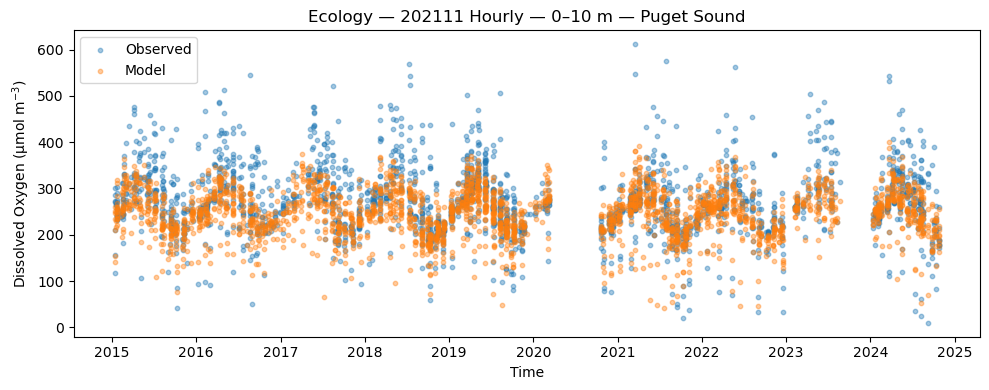

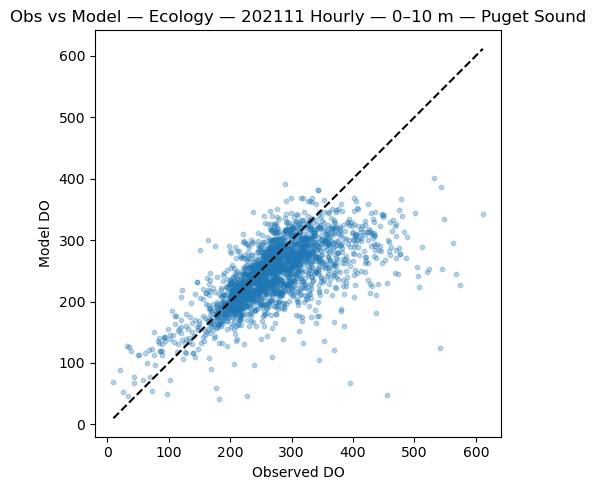

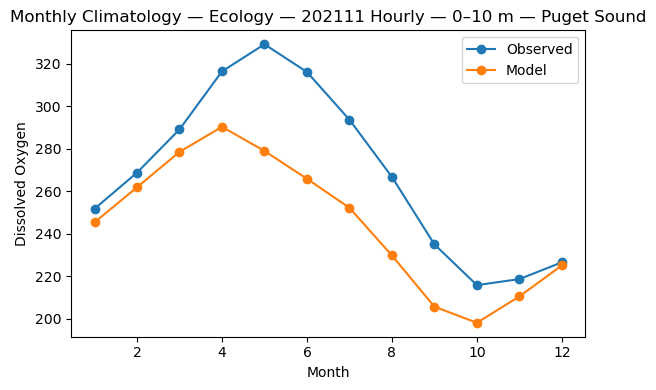

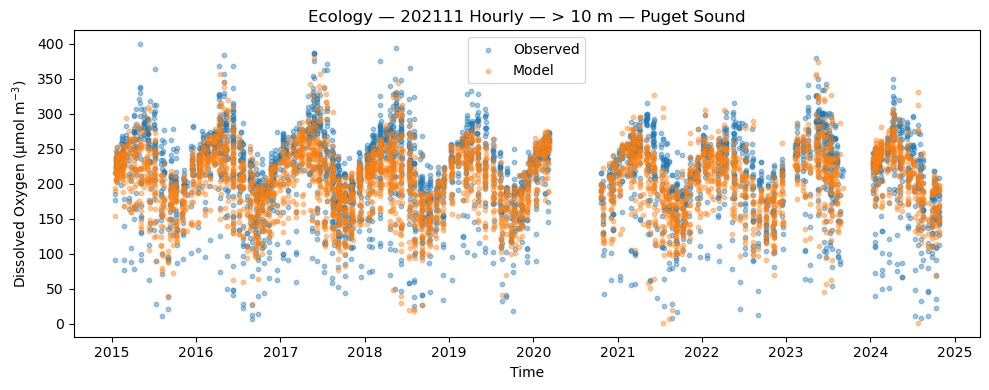

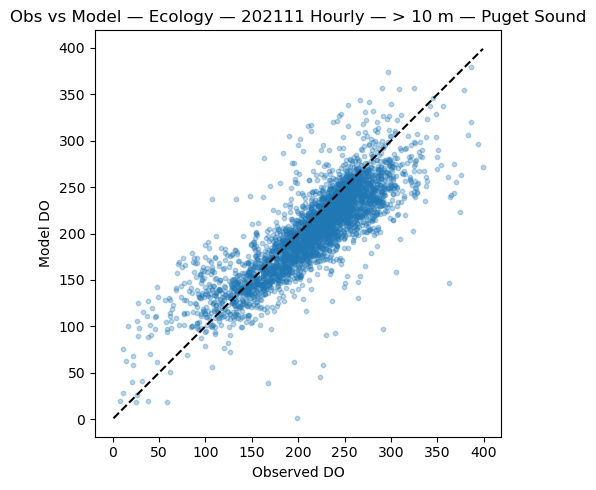

...

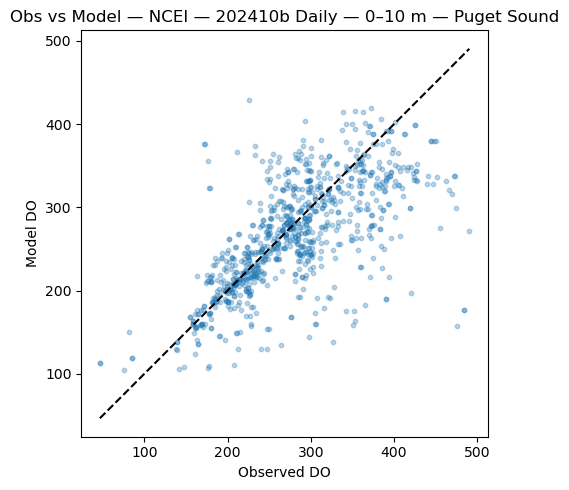

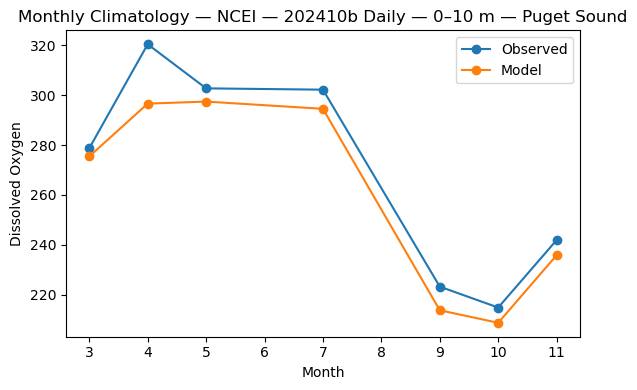

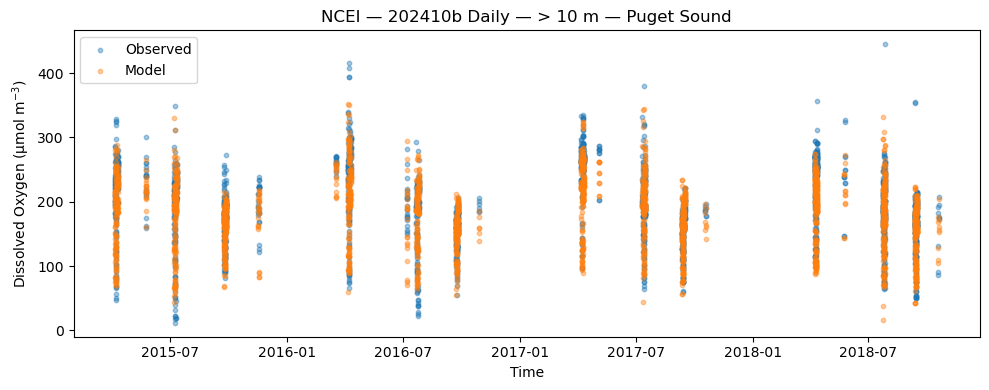

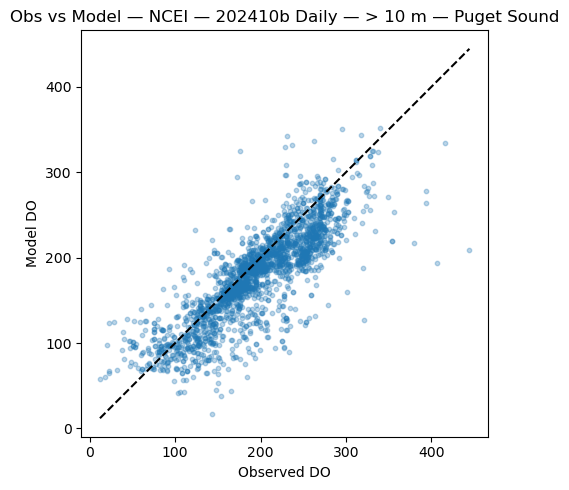

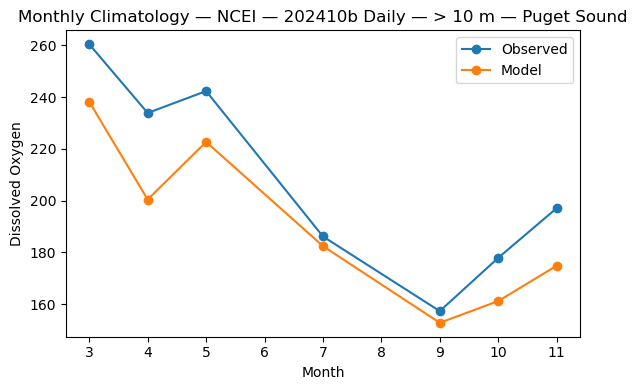

In [4]:
# PLOTTING

# Ecology-from-Parker-Dakota
plot_obs_model_by_depth(d111_eco, "Ecology — 202111 Hourly")
plot_obs_model_by_depth(d410_eco, "Ecology — 202410b Daily")

# DFO1-from-Parker
plot_obs_model_by_depth(d111_dfo1, "DFO1 — 202111 Hourly")
plot_obs_model_by_depth(d410_dfo1, "DFO1 — 202410b Daily")

# KC-from-Parker
plot_obs_model_by_depth(d111_kc, "KC — 202111 Hourly")
plot_obs_model_by_depth(d410_kc, "KC — 202410b Daily")

# NCEI-from-Parker
plot_obs_model_by_depth(d111_ncei, "NCEI — 202111 Hourly")
plot_obs_model_by_depth(d410_ncei, "NCEI — 202410b Daily")


### Model vs Obs only (Salinity + Dissolved Oxygen)

In [5]:
plt.rcParams.update({
    "font.size": 14,
    "axes.titlesize": 14,
    "axes.labelsize": 14,
    "xtick.labelsize": 14,
    "ytick.labelsize": 14,
    "legend.fontsize": 14,
    "figure.titlesize": 14,
})

lonPS1, lonPS2, latPS1, latPS2 = (-123.2, -122.2, 47.05, 48.35)
#lonPS1, lonPS2, latPS1, latPS2 = (-128, -122, 47.05, 52)


def load_files(file_list):
    dfs = []
    for f in file_list:
        if Path(f).exists():
            df = pd.read_csv(f, parse_dates=["dtUTC"])
            dfs.append(df)
        else:
            print(f"WARNING: missing file {f}")
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

def plot_obs_vs_model_subplots(datasets, model_label, daily_mean=False):

    n = len(datasets)
    fig, axes = plt.subplots(1, n, figsize=(5 * n, 5), sharex=True, sharey=True)

    if n == 1:
        axes = [axes]

    depth_colors = {
        "> 10 m": "tab:orange",
        "0–10 m": "tab:blue",
    }

    for ax, (name, d) in zip(axes, datasets.items()):

        if d.empty:
            ax.set_title(f"{name}\n(no data)")
            continue

        d = d.copy()
        d["dtUTC"] = pd.to_datetime(d["dtUTC"])

        # Puget Sound
        d = d[
            (d["Lon"] >= lonPS1) & (d["Lon"] <= lonPS2) &
            (d["Lat"] >= latPS1) & (d["Lat"] <= latPS2)
        ]

        d = d.dropna(subset=["Oxygen_Dissolved", "mod_dissolved_oxygen"])

        if d.empty:
            ax.set_title(f"{name}\n(no PS data)")
            continue

        # Daily mean 
        if daily_mean:
            d["date"] = d["dtUTC"].dt.floor("D")
            d = (
                d.groupby(["date", "Z"])
                [["Oxygen_Dissolved", "mod_dissolved_oxygen"]]
                .mean()
                .reset_index()
            )

        # Depth ranges
        bins = {
            "0–10 m": d[(d["Z"] >= 0) & (d["Z"] <= 10)],
            "> 10 m": d[d["Z"] > 10],
        }

        y_text = 0.95  # vertical position for text boxes

        for depth_label, df in bins.items():

            if df.empty:
                continue

            # Scatter
            ax.scatter(
                df["Oxygen_Dissolved"],
                df["mod_dissolved_oxygen"],
                s=12,
                alpha=0.4,
                color=depth_colors[depth_label],
                label=depth_label,
            )

            # Statistics for THIS depth range
            diff = df["mod_dissolved_oxygen"] - df["Oxygen_Dissolved"]
            bias = diff.mean()
            rmse = np.sqrt((diff ** 2).mean())
            npts = len(df)

            x_text = 0.05 if depth_label == "0–10 m" else 0.65

            ax.text(
                x_text,
                y_text,
                f"{depth_label}\n"
                f"N = {npts}\n"
                f"Bias = {bias:.2f}\n"
                f"RMSE = {rmse:.2f}",
                transform=ax.transAxes,
                ha="left",
                va="top",
                color=depth_colors[depth_label],
            )

        # 1:1 line
        lims = [
            min(d["Oxygen_Dissolved"].min(), d["mod_dissolved_oxygen"].min()),
            max(d["Oxygen_Dissolved"].max(), d["mod_dissolved_oxygen"].max()),
        ]
        ax.plot(lims, lims, "k--", lw=1)
        ax.set_aspect("equal")
        ax.set_title(name)

    axes[0].set_ylabel("Model DO (mmol m$^{-3}$)")
    for ax in axes:
        ax.set_xlabel("Observed DO (mmol m$^{-3}$)")

    fig.suptitle(
        f"Puget Sound — {model_label}",
        y=0.98
    )

    fig.tight_layout(rect=[0, 0, 1, 0.90])
    plt.show()

def plot_obs_vs_model_subplots_salinity(datasets, model_label):

    n = len(datasets)
    fig, axes = plt.subplots(1, n, figsize=(5 * n, 5), sharex=True, sharey=True)

    if n == 1:
        axes = [axes]

    depth_colors = {
        "> 10 m": "tab:orange",
        "0–10 m": "tab:blue",
    }

    for ax, (name, d) in zip(axes, datasets.items()):

        if d.empty:
            ax.set_title(f"{name}\n(no data)")
            continue

        d = d.copy()
        d["dtUTC"] = pd.to_datetime(d["dtUTC"])

        # Puget Sound spatial filter
        d = d[
            (d["Lon"] >= lonPS1) & (d["Lon"] <= lonPS2) &
            (d["Lat"] >= latPS1) & (d["Lat"] <= latPS2)
        ]

        # Keep only matched salinity points
        d = d.dropna(subset=["Salinity", "mod_vosaline"])

        if d.empty:
            ax.set_title(f"{name}\n(no PS data)")
            continue

        # Depth bins
        bins = {
            "0–10 m": d[(d["Z"] >= 0) & (d["Z"] <= 10)],
            "> 10 m": d[d["Z"] > 10],
        }

        for depth_label, df in bins.items():

            if df.empty:
                continue

            ax.scatter(
                df["Salinity"],
                df["mod_vosaline"],
                s=12,
                alpha=0.4,
                color=depth_colors[depth_label],
                label=depth_label,
            )

            diff = df["mod_vosaline"] - df["Salinity"]
            bias = diff.mean()
            rmse = np.sqrt((diff ** 2).mean())
            npts = len(df)

            #x_text = 0.05 if depth_label == "0–10 m" else 0.65
            x_text = 0.05
            y_text = 0.95 if depth_label == "0–10 m" else 0.3

            ax.text(
                x_text,
                y_text,
                f"{depth_label}\n"
                f"N = {npts}\n"
                f"Bias = {bias:.2f}\n"
                f"RMSE = {rmse:.2f}",
                transform=ax.transAxes,
                ha="left",
                va="top",
                color=depth_colors[depth_label],
            )

        # 1:1 line
        lims = [
            min(d["Salinity"].min(), d["mod_vosaline"].min()),
            max(d["Salinity"].max(), d["mod_vosaline"].max()),
        ]
        ax.plot(lims, lims, "k--", lw=1)
        ax.set_aspect("equal")
        ax.set_title(name)

    axes[0].set_ylabel("Model Salinity (g/kg)")
    for ax in axes:
        ax.set_xlabel("Observed Salinity (g/kg)")

    fig.suptitle(
        f"Puget Sound — {model_label}",
        y=0.98
    )

    fig.tight_layout(rect=[0, 0, 1, 0.90])
    plt.show()


In [6]:
# DATA LOADING 

# Ecology (2015–2024)
years_eco = range(2015, 2025)
paths_eco_410 = [f"/ocean/atall/MOAD/ObsModel/202410bdaily/ObsModel_202410b_eco_from_parker_{y}0101_{y}1231.csv" for y in years_eco]
paths_eco_111 = [f"/ocean/atall/MOAD/ObsModel/202111/ObsModel_202111_eco_from_parker_{y}0101_{y}1231.csv" for y in years_eco]
d410_eco = load_files(paths_eco_410)
d111_eco = load_files(paths_eco_111)

# KC (2015–2023)
years_kc = range(2015, 2024)
paths_kc_410 = [f"/ocean/atall/MOAD/ObsModel/202410bdaily/ObsModel_202410b_kc_from_parker_{y}0101_{y}1231.csv" for y in years_kc]
paths_kc_111 = [f"/ocean/atall/MOAD/ObsModel/202111/ObsModel_202111_kc_from_parker_{y}0101_{y}1231.csv" for y in years_kc]
d410_kc = load_files(paths_kc_410)
d111_kc = load_files(paths_kc_111)

# DFO (2015–2021)
years_dfo1 = range(2015, 2022)
paths_dfo1_410 = [f"/ocean/atall/MOAD/ObsModel/202410bdaily/ObsModel_202410b_dfo1_from_parker_{y}0101_{y}1231.csv" for y in years_dfo1]
paths_dfo1_111 = [f"/ocean/atall/MOAD/ObsModel/202111/ObsModel_202111_dfo1_from_parker_{y}0101_{y}1231.csv" for y in years_dfo1]
d410_dfo1 = load_files(paths_dfo1_410)
d111_dfo1 = load_files(paths_dfo1_111)

# NCEI (2015–2018)
years_ncei = range(2015, 2019)
paths_ncei_410 = [f"/ocean/atall/MOAD/ObsModel/202410bdaily/ObsModel_202410b_ncei_from_parker_{y}0101_{y}1231.csv" for y in years_ncei]
paths_ncei_111 = [f"/ocean/atall/MOAD/ObsModel/202111/ObsModel_202111_ncei_from_parker_{y}0101_{y}1231.csv" for y in years_ncei]
d410_ncei = load_files(paths_ncei_410)
d111_ncei = load_files(paths_ncei_111)

# Plot
datasets_410 = {
    "KC": d410_kc,
    "NCEI": d410_ncei,
    "Ecology": d410_eco,
    "DFO": d410_dfo1,
}

datasets_111 = {
    "KC": d111_kc,
    "NCEI": d111_ncei,
    "Ecology": d111_eco,
    "DFO": d111_dfo1,
}

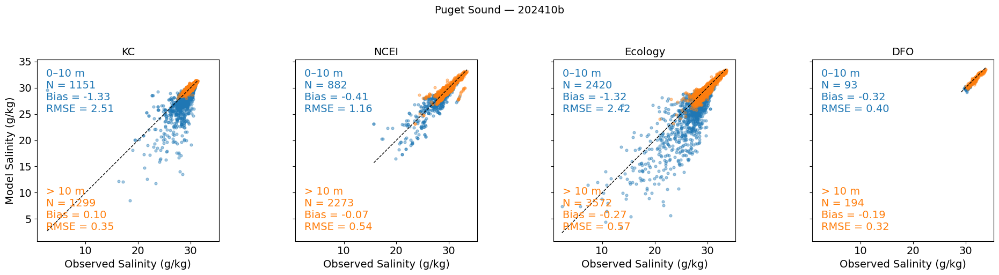

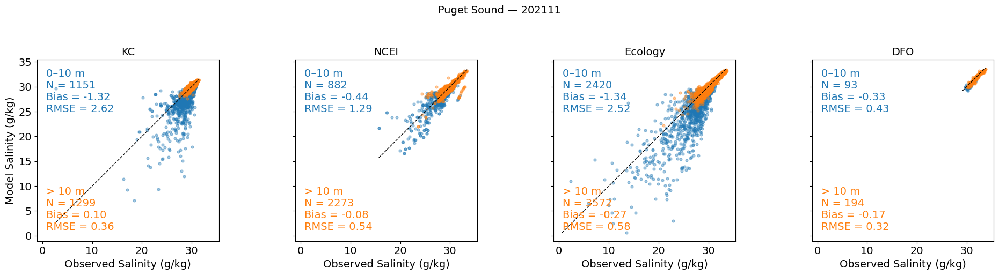

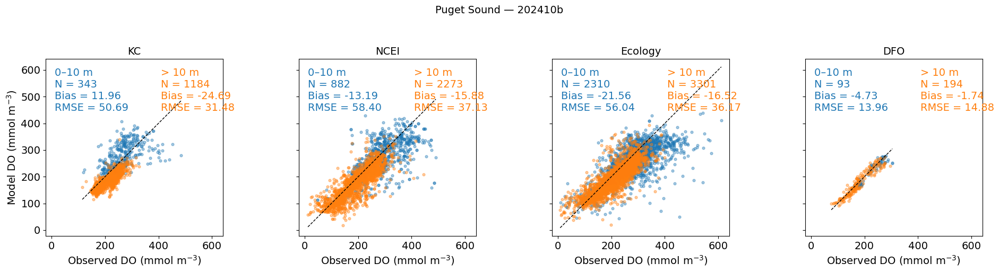

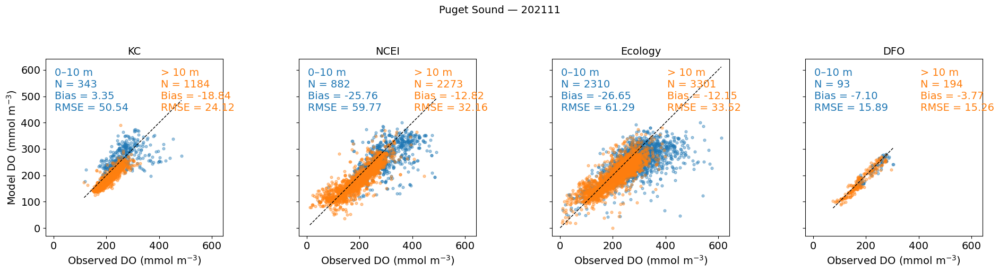

In [7]:
plot_obs_vs_model_subplots_salinity(datasets_410, "202410b")
plot_obs_vs_model_subplots_salinity(datasets_111, "202111")
plot_obs_vs_model_subplots(datasets_410, "202410b", daily_mean=False)
plot_obs_vs_model_subplots(datasets_111, "202111", daily_mean=False)

#plot_obs_vs_model_subplots(datasets_410, "202410b (daily)", daily_mean=True)
#plot_obs_vs_model_subplots(datasets_111, "202111 (hourly)", daily_mean=True)


### Merge all Parker's datasets (KC, KCPJ, NCEISalish, Ecology, DFO) - Puget Sound only

In [8]:
plt.rcParams.update({
    "font.size": 13,
    "axes.titlesize": 14,
    "axes.labelsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 11,
    "figure.titlesize": 15,
})

# Puget Sound region
lonPS1, lonPS2 = -123.2, -122.2
latPS1, latPS2 = 47.05, 48.35


# functions
def load_files(file_list):
    dfs = []
    for f in file_list:
        if Path(f).exists():
            dfs.append(pd.read_csv(f, parse_dates=["dtUTC"]))
        #else:
            #print(f"WARNING: missing {f}")
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

def merge_datasets(datasets):
    return pd.concat(datasets.values(), ignore_index=True)

def plot_panel(ax, d, obs, mod, title, xlabel, ylabel):

    depth_colors = { "deep": "darkblue", "shallow": "red"}

    #d = d[
        #(d["Lon"] >= lonPS1) & (d["Lon"] <= lonPS2) &
        #(d["Lat"] >= latPS1) & (d["Lat"] <= latPS2)
    #].dropna(subset=[obs, mod, "Z"])
    d = d.dropna(subset=[obs, mod, "Z"])

    bins = {
        "deep": d[d["Z"] > 10],
        "shallow": d[(d["Z"] >= 0) & (d["Z"] <= 10)],
    }

    for label, df in bins.items():
        if df.empty:
            continue

        ax.scatter(df[obs], df[mod], s=10, alpha=0.4,
                   color=depth_colors[label], label=label)

        diff = df[mod] - df[obs]
        x_text = 0.05
        #stats_base = f"N={len(df)}, Bias={diff.mean():.2f}, RMSE={np.sqrt((diff**2).mean()):.2f}"
        stats_base = f"bias={diff.mean():.2f}, rmse={np.sqrt((diff**2).mean()):.2f}"
        
        if obs.lower().startswith("salinity"):
            ax.text(0.75, 0.13,
                    'shallow',
                    transform=ax.transAxes,
                    va="top",
                    ha="left",
                    color=depth_colors[label],
                    fontsize=15
                    ) if label == "shallow" else ax.text(0.75, 0.07, 
                                                         'deep',
                                                         transform=ax.transAxes,
                                                         va="top",
                                                         ha="left",
                                                         color=depth_colors[label],
                                                         fontsize=15
                                                         ) # show deep and shallow labels for salinity plots
            y_text = 0.99 if label == "shallow" else 0.94
        else: 
            y_text = 0.99 if label == "shallow" else 0.94
        ax.text(
            x_text,
            y_text,
            f"{stats_base}",
            transform=ax.transAxes,
            va="top",
            ha="left",
            color=depth_colors[label],
            fontsize=12
            )


    lims = [min(d[obs].min(), d[mod].min()),
            max(d[obs].max(), d[mod].max())]
    ax.plot(lims, lims, "k--", lw=1)
    ax.set_aspect("equal")
    ax.set_title(title)
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)

def subset_domain(d, domain):
    if domain == "puget":
        return d[
            (d["Lon"] >= lonPS1) & (d["Lon"] <= lonPS2) &
            (d["Lat"] >= latPS1) & (d["Lat"] <= latPS2)
        ]
    else:
        return d

In [9]:
# DATA LOADING
years = range(2015, 2025)

def paths(base, tag, src):
    return [f"{base}/ObsModel_{tag}_{src}_from_parker_{y}0101_{y}1231.csv" for y in years]

datasets_410 = {
    "Eco": load_files(paths("/ocean/atall/MOAD/ObsModel/202410bdaily", "202410b", "eco")),
    "KC":  load_files(paths("/ocean/atall/MOAD/ObsModel/202410bdaily", "202410b", "kc")),
    "KCPJ":  load_files(paths("/ocean/atall/MOAD/ObsModel/202410bdaily", "202410b", "kcPJ")),
    "DFO": load_files(paths("/ocean/atall/MOAD/ObsModel/202410bdaily", "202410b", "dfo1")),
    "NCEI":load_files(paths("/ocean/atall/MOAD/ObsModel/202410bdaily", "202410b", "ncei")),
}

datasets_111 = {
    "Eco": load_files(paths("/ocean/atall/MOAD/ObsModel/202111", "202111", "eco")),
    "KC":  load_files(paths("/ocean/atall/MOAD/ObsModel/202111", "202111", "kc")),
    "KCPJ":  load_files(paths("/ocean/atall/MOAD/ObsModel/202111", "202111", "kcPJ")),
    "DFO": load_files(paths("/ocean/atall/MOAD/ObsModel/202111", "202111", "dfo1")),
    "NCEI":load_files(paths("/ocean/atall/MOAD/ObsModel/202111", "202111", "ncei")),
}

all_410 = merge_datasets(datasets_410)
all_111 = merge_datasets(datasets_111)


In [10]:
VARS = [
    dict(
        name="Salinity",
        obs="Salinity",
        mod="mod_vosaline",
        units="g/kg"
    ),
    dict(
        name="Temperature",
        obs="Temperature",
        mod="mod_votemper",
        units="°C"
    ),
    dict(
        name="DO",
        obs="Oxygen_Dissolved",
        mod="mod_dissolved_oxygen",
        units="uM"
    ),
    dict(
        name="NO$_3$",
        obs="NO3",
        mod="mod_nitrate",
        units="uM"
    ),
    dict(
        name="TA",
        obs="TA (uM)",
        mod="mod_total_alkalinity",
        units="uM"
    ),
    dict(
        name="DIC",
        obs="DIC (uM)",
        mod="mod_dissolved_inorganic_carbon",
        units="uM"
    ),
]


In [11]:
def plot_comparison(data, tag, fig_title,domain):
    fig, axes = plt.subplots(2, 3, figsize=(16, 10))
    axes = axes.flatten()

    for ax, v in zip(axes, VARS):

        # unit conversion to match with DO of LO and SSea plots
        conv = 1.0
        units = v["units"]

        if v["name"].lower() == "do":
            conv = 0.0319988   # µM to mg/L
            units = "mg L$^{-1}$"

        d = subset_domain(data.copy(), domain)

        d[v["obs"]] = d[v["obs"]] * conv
        d[v["mod"]] = d[v["mod"]] * conv

        plot_panel(
            ax,
            d,
            v["obs"],
            v["mod"],
            f'{v["name"]} ({units})',
            "Observations",
            f"Model-{tag}",
        )

    fig.suptitle(fig_title, y=0.96)
    fig.tight_layout(rect=[0, 0, 1, 0.94])
    plt.show()


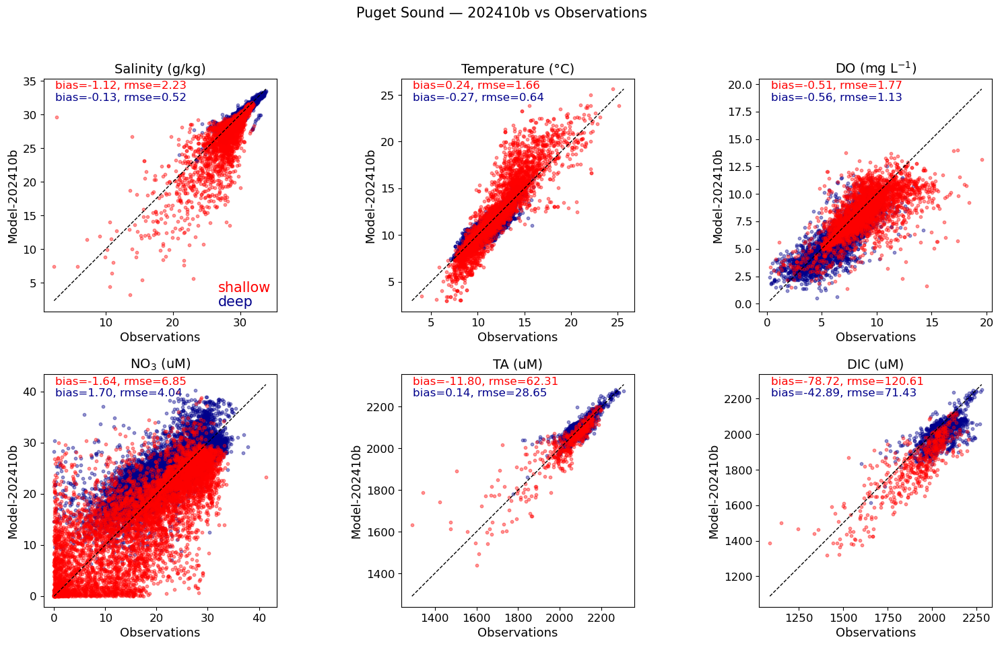

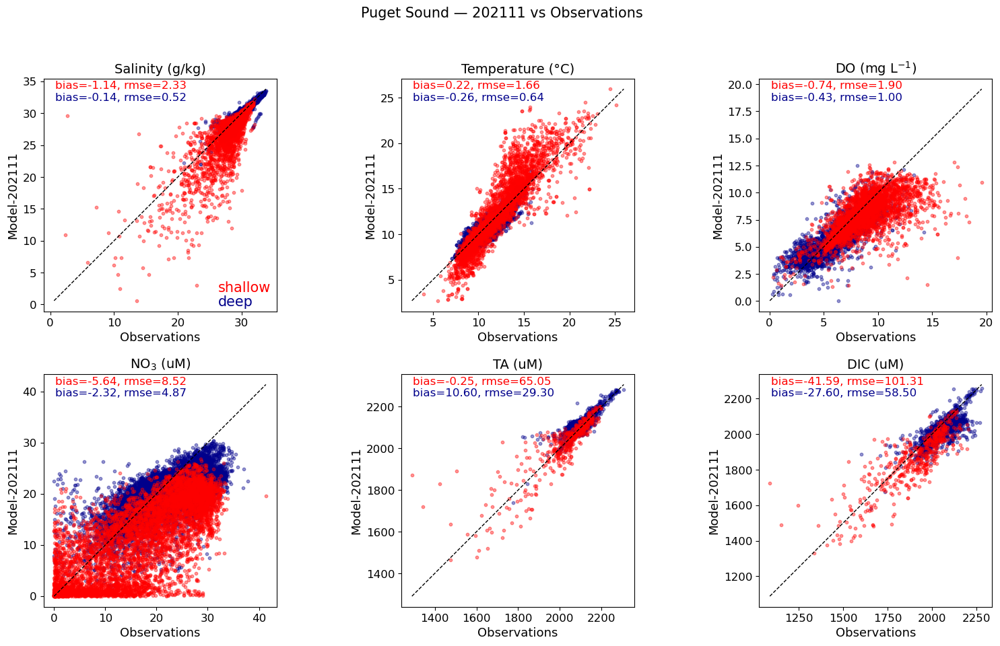

In [12]:
# Figure 1 — 202410b
plot_comparison(
    all_410,
    tag="202410b",
    fig_title="Puget Sound — 202410b vs Observations",
    domain="puget"
)

# Figure 2 — 202111
plot_comparison(
    all_111,
    tag="202111",
    fig_title="Puget Sound — 202111 vs Observations",
    domain="puget"
)


### Near-bottom at Point Jefferson

In [13]:
kcPJ_111 = load_files(
    paths("/ocean/atall/MOAD/ObsModel/202111", "202111", "kcPJ")
)

kcPJ_410 = load_files(
    paths("/ocean/atall/MOAD/ObsModel/202410bdaily", "202410b", "kcPJ")
)

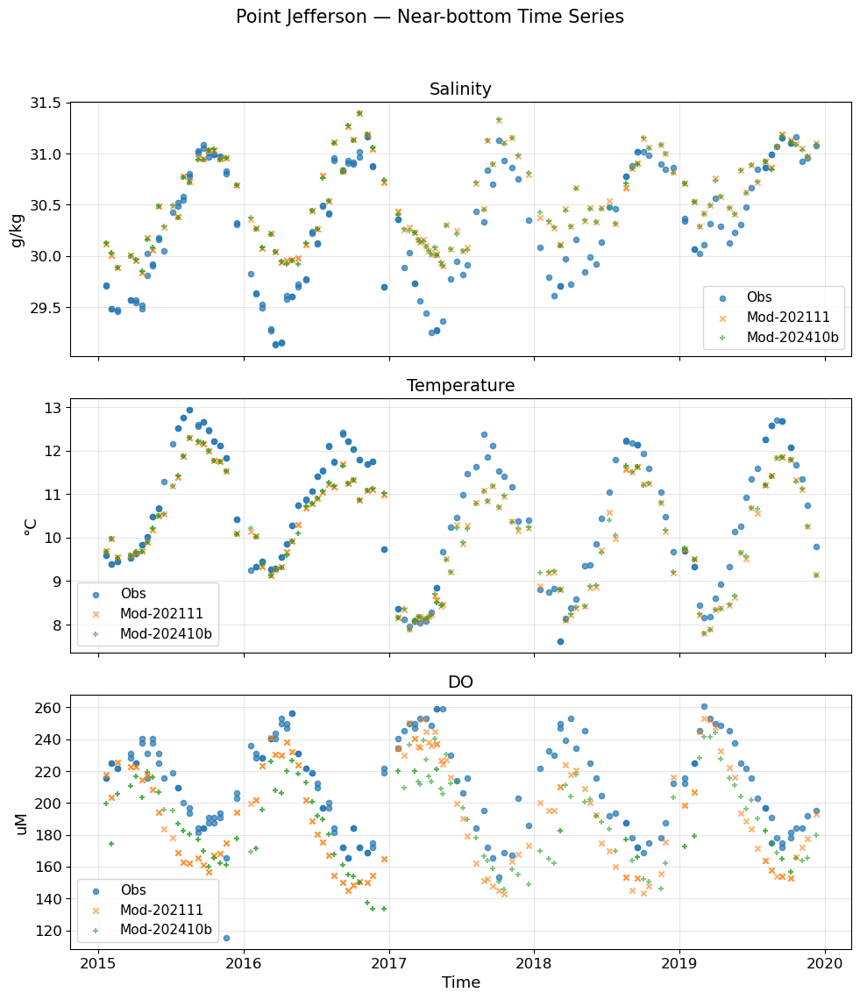

In [14]:
def plot_timeseries_PJ_scatter(df_111, df_410):
    fig, axes = plt.subplots(3, 1, figsize=(10, 12), sharex=True)
    axes = axes.flatten()

    zmin, zmax = 190, 201 # near-bottom at Point Jefferson

    for ax, v in zip(axes, VARS[:3]):

        d_obs = (
            df_111
            .dropna(subset=[v["obs"], "Z"])
            .query("Z >= @zmin and Z <= @zmax")
        )

        ax.scatter(
            d_obs["dtUTC"],
            d_obs[v["obs"]],
            s=20,
            alpha=0.7,
            label="Obs",
        )

        d111 = (
            df_111
            .dropna(subset=[v["mod"], "Z"])
            .query("Z >= @zmin and Z <= @zmax")
        )

        ax.scatter(
            d111["dtUTC"],
            d111[v["mod"]],
            s=20,
            alpha=0.6,
            marker="x",
            label="Mod-202111",
        )

        d410 = (
            df_410
            .dropna(subset=[v["mod"], "Z"])
            .query("Z >= @zmin and Z <= @zmax")
        )

        ax.scatter(
            d410["dtUTC"],
            d410[v["mod"]],
            s=20,
            alpha=0.6,
            marker="+",
            label="Mod-202410b",
        )

        ax.set_title(v["name"])
        ax.set_ylabel(v["units"])
        ax.grid(alpha=0.3)

        ax.legend()

    axes[-1].set_xlabel("Time")

    fig.suptitle(
        "Point Jefferson — Near-bottom Time Series",
        y=0.95
    )
    fig.tight_layout(rect=[0, 0, 1, 0.93])
    plt.show()
plot_timeseries_PJ_scatter(kcPJ_111, kcPJ_410)


## For Inter-models comparison

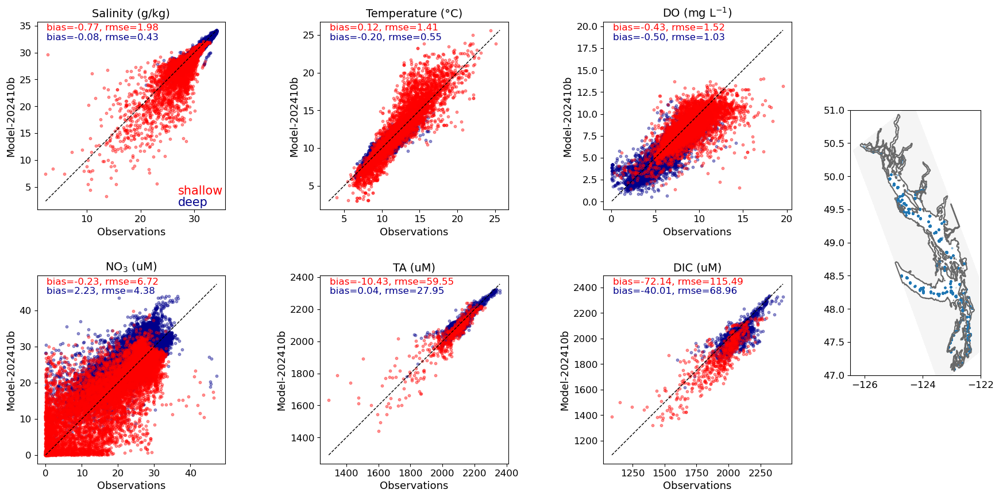

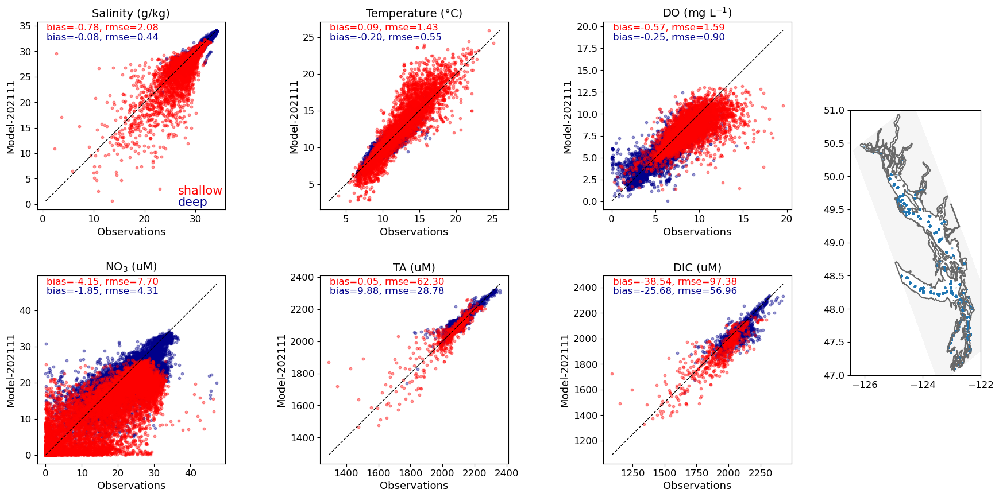

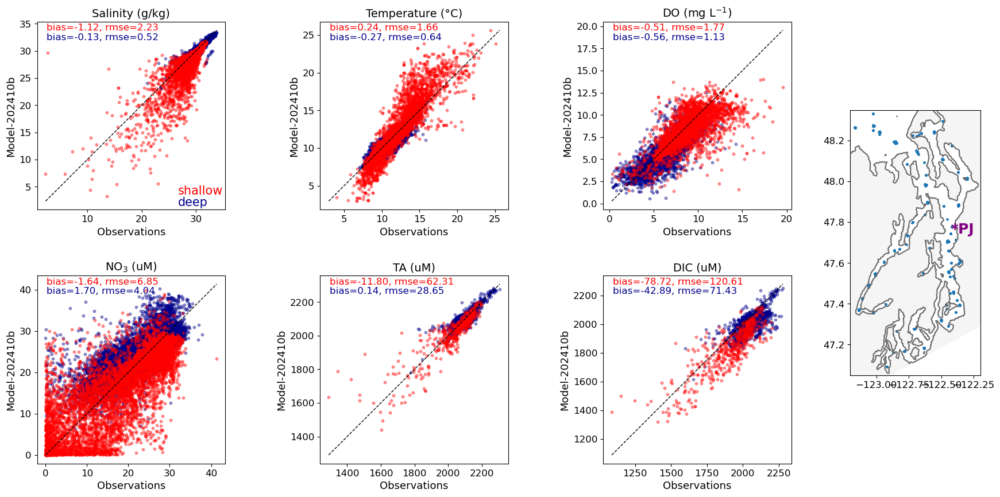

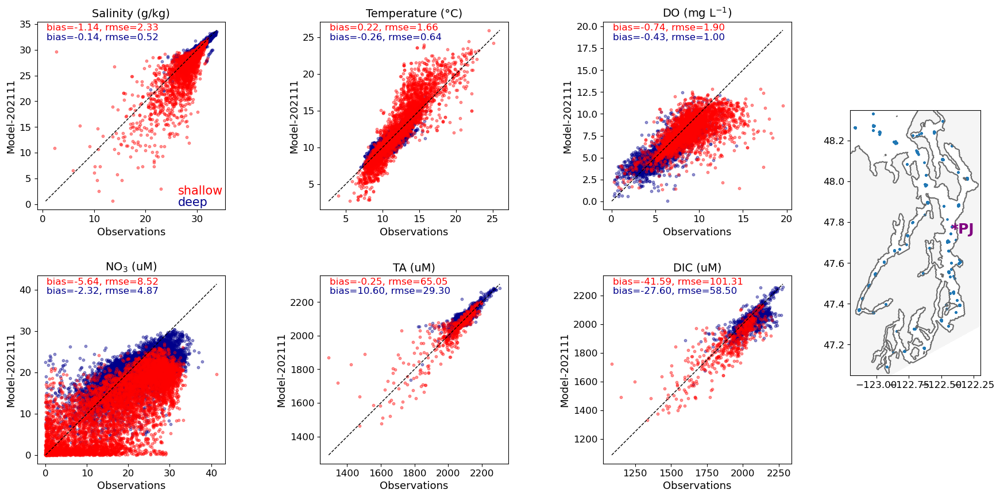

In [16]:
def domain_map(ax_map, d, mesh, lonlim=None, latlim=None, rectangle=None, PJ=None, title=""):
    ax_map.contourf(mesh.nav_lon, mesh.nav_lat, mesh.mbathy[0],
                    levels=[-0.01, 0.01], colors="whitesmoke")
    ax_map.contour(mesh.nav_lon, mesh.nav_lat, mesh.mbathy[0],
                   levels=[-0.01, 0.01], colors="dimgray")

    ax_map.scatter(d["Lon"], d["Lat"], s=4, alpha=0.4, label="Observations")

    if rectangle is not None:
        lon1, lon2, lat1, lat2 = rectangle
        ax_map.add_patch(
            mpatches.Rectangle(
                (lon1, lat1),
                lon2 - lon1,
                lat2 - lat1,
                fill=False, edgecolor="purple", linewidth=2,
            )
        )

    if lonlim and latlim:
        ax_map.set_xlim(lonlim)
        ax_map.set_ylim(latlim)
    
    if PJ is not None:
        ax_map.text(-122.4280014, 47.7439995, '*PJ', color='purple', fontweight='bold', fontsize=18)

    #ax_map.set_xlabel("Longitude")
    #ax_map.set_ylabel("Latitude")
    #ax_map.set_title(title)

def plot_comparison_with_map(data, tag, fig_title, mesh, domain="entire", fname="comparison_with_map.png"):
    if domain == "puget":
        lonlim, latlim = [-123.2, -122.2], [47.05, 48.35]
        rectangle = None
        PJ = True
    else:  # entire domain
        lonlim, latlim = [-126.5, -122], [47, 51]
        rectangle = None
        #rectangle = [-123.2, -122.2, 47.05, 48.35]
        PJ = None

    fig = plt.figure(figsize=(22, 10))
    gs = gridspec.GridSpec(2, 4, width_ratios=[1, 1, 1, 0.5], hspace=0.35, wspace=0.1)

    # panels axes
    axes = [fig.add_subplot(gs[i, j]) for i in range(2) for j in range(3)]

    ax_map = fig.add_subplot(gs[:, 3])
    pos = ax_map.get_position()
    ax_map.set_position([pos.x0, pos.y0 + 0.2*pos.height, pos.width, 0.6*pos.height])

    # model vs obs plots
    for ax, v in zip(axes, VARS):
        conv = 1.0
        units = v["units"]
        if v["name"].lower() == "do":
            conv = 0.0319988
            units = "mg L$^{-1}$"

        d = subset_domain(data.copy(), domain)

        d[v["obs"]] = d[v["obs"]] * conv
        d[v["mod"]] = d[v["mod"]] * conv

        plot_panel(ax, d, v["obs"], v["mod"],
                   f"{v['name']} ({units})", "Observations", f"Model-{tag}")

    # map panel
    domain_map(ax_map, data, mesh, lonlim, latlim, rectangle, PJ,
                   title="Domain Map")

    plt.savefig(fname, dpi=300, bbox_inches="tight")
    plt.show()

# load mesh 
mesh = xr.open_dataset("/ocean/atall/MOAD/grid/mesh_mask202108.nc")

# entire domain figure 
plot_comparison_with_map(all_410, tag="202410b", fig_title="Entire Domain — 202410b vs Observations", mesh=mesh, domain="entire",
                         fname="Fig_EntireDomain_202410b_vs_Obs.png")
plot_comparison_with_map(all_111, tag="202111", fig_title="Entire Domain — 202111 vs Observations", mesh=mesh, domain="entire",
                         fname="Fig_EntireDomain_202111_vs_Obs.png")
# Puget Sound figure 
plot_comparison_with_map(all_410, tag="202410b", fig_title="Puget Sound — 202410b vs Observations", mesh=mesh, domain="puget",
                         fname="Fig_PugetSound_202410b_vs_Obs.png")
plot_comparison_with_map(all_111, tag="202111", fig_title="Puget Sound — 202111 vs Observations", mesh=mesh, domain="puget",
                         fname="Fig_PugetSound_202111_vs_Obs.png")

### DO only - Stats - Hypoxia

In [ ]:
def compute_stats(d, obs, mod):
    diff = d[mod] - d[obs]
    return {
        "N": len(d),
        "bias": diff.mean(),
        "rmse": np.sqrt((diff**2).mean()),
    }
def prepare_do(data, domain, do_range=None):
    d = subset_domain(data.copy(), domain)

    conv = 0.0319988  # mmol/m3 → mg/L
    d["Oxygen_Dissolved"] *= conv
    d["mod_dissolved_oxygen"] *= conv

    d = d.dropna(subset=["Oxygen_Dissolved", "mod_dissolved_oxygen", "Z"])

    if do_range is not None:
        lo, hi = do_range
        d = d[
            (d["Oxygen_Dissolved"] >= lo) & (d["Oxygen_Dissolved"] <= hi) &
            (d["mod_dissolved_oxygen"] >= lo) & (d["mod_dissolved_oxygen"] <= hi)
        ]

    return d

def plot_do_panel(ax, d, title):
    depth_colors = {"shallow": "darkred", "deep": "darkblue"}

    bins = {
        "shallow": d[(d["Z"] >= 0) & (d["Z"] <= 10)],
        "deep": d[d["Z"] > 10],
    }

    for label, df in bins.items():
        if df.empty:
            continue

        ax.scatter(
            df["Oxygen_Dissolved"],
            df["mod_dissolved_oxygen"],
            s=10,
            alpha=0.4,
            color=depth_colors[label],
            label=label,
        )

        stats = compute_stats(df, "Oxygen_Dissolved", "mod_dissolved_oxygen")

        ax.text(
            0.03,
            0.97 if label == "shallow" else 0.90,
            f"{label}",
            transform=ax.transAxes,
            va="top",
            color=depth_colors[label],
            fontsize=13,
        )
        x_text = 0.36
        y_text = 0.12
        ax.text(
            x_text,
            y_text if label == "shallow" else y_text - 0.07,
            f"bias={stats['bias']:.2f}, rmse={stats['rmse']:.2f}",
            transform=ax.transAxes,
            va="top",
            color=depth_colors[label],
            fontsize=13,
        )

    lims = [
        min(d["Oxygen_Dissolved"].min(), d["mod_dissolved_oxygen"].min()),
        max(d["Oxygen_Dissolved"].max(), d["mod_dissolved_oxygen"].max()),
    ]
    ax.plot(lims, lims, "k--", lw=1)
    ax.set_aspect("equal")
    ax.set_title(title)
    ax.set_xlabel("Observed DO (mg L$^{-1}$)")
    ax.set_ylabel("Model DO (mg L$^{-1}$)")

def plot_row(fig, gs, row, data_111, data_410, mesh, domain, do_range, label):
    ax1 = fig.add_subplot(gs[row, 0])
    ax2 = fig.add_subplot(gs[row, 1])
    axm = fig.add_subplot(gs[row, 2])

    d111 = prepare_do(data_111, domain, do_range)
    d410 = prepare_do(data_410, domain, do_range)

    plot_do_panel(ax1, d111, f"202111 – {label}")
    plot_do_panel(ax2, d410, f"202410 – {label}")

    domain_map(
        axm,
        d111,
        mesh,
        lonlim=[-123.2, -122.2] if domain == "puget" else [-126.5, -122],
        latlim=[47.05, 48.35] if domain == "puget" else [47, 51],
        PJ=(domain == "puget"),
    )
def plot_summary_figure(data_111, data_410, mesh, do_range, fname):
    fig = plt.figure(figsize=(16, 10))
    gs = gridspec.GridSpec(2, 3, wspace=0.25, hspace=0.3)

    plot_row(fig, gs, 0, data_111, data_410, mesh, "entire", do_range, "Salish Sea")
    plot_row(fig, gs, 1, data_111, data_410, mesh, "puget", do_range, "Puget Sound")

    plt.savefig(fname, dpi=300, bbox_inches="tight")
    #plt.close()


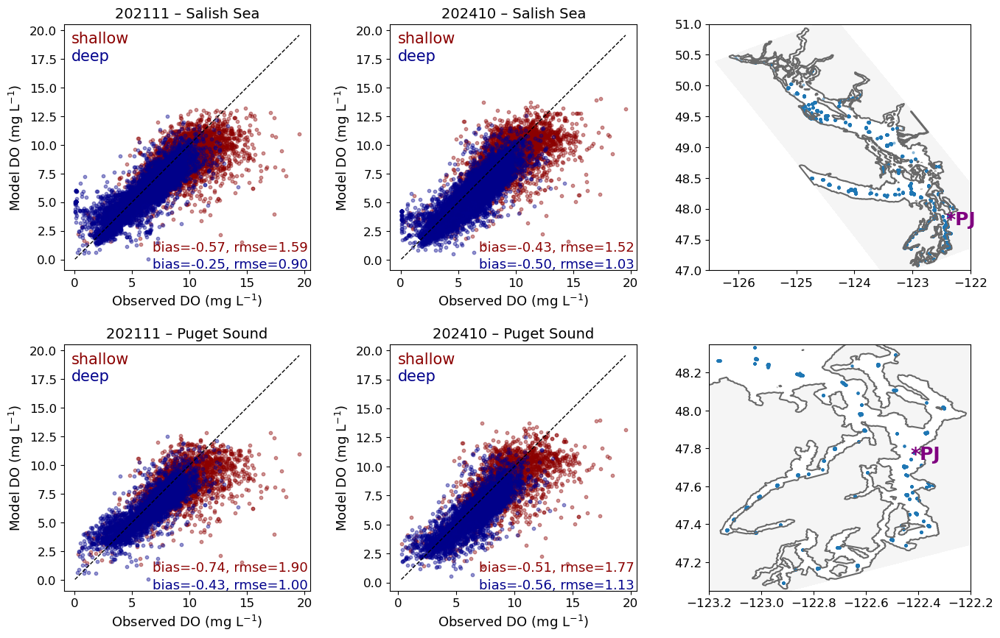

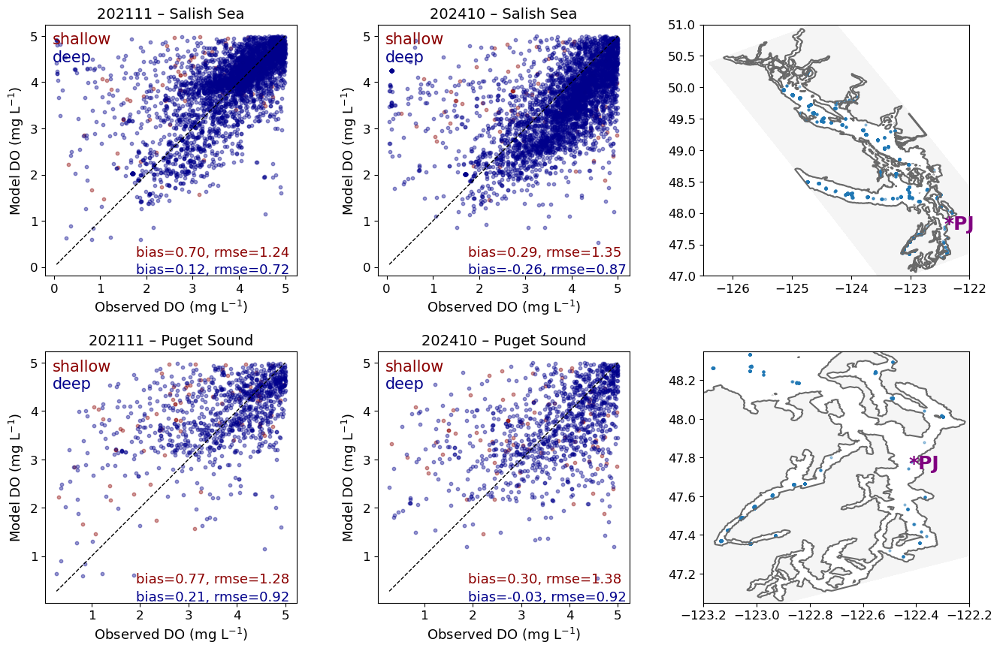

In [ ]:
# FIG 1 – full range
plot_summary_figure(all_111, all_410, mesh, do_range=None,
                    fname="Fig1_DO_full_range.png")

# FIG 2 – hypoxic zoom
plot_summary_figure(all_111, all_410, mesh, do_range=(0, 5),
                    fname="Fig2_DO_0_5.png")


In [ ]:
rows = []

for domain in ["entire", "puget"]:
    for tag, data in [("202111", all_111), ("202410", all_410)]:
        for label, r in [
            ("full", None),
            ("0–5", (0, 5)),
            ("0–2", (0, 2)),
        ]:
            d = prepare_do(data, domain, r)
            if d.empty:
                continue

            stats = compute_stats(d, "Oxygen_Dissolved", "mod_dissolved_oxygen")
            rows.append({
                "Version": tag,
                "Domain": domain,
                "Range": label,
                **stats,
            })

stats_df = pd.DataFrame(rows)
stats_df.to_csv("DO_stats_summary.csv", index=False)

display(stats_df)

,Version,Domain,Range,N,bias,rmse
0,202111,entire,full,21767,-0.348378,1.164190
1,202111,entire,0–5,3822,0.132108,0.735227
2,202111,entire,0–2,29,-0.006546,0.486800
3,202410,entire,full,21767,-0.481936,1.201671
4,202410,entire,0–5,4070,-0.246095,0.886265
5,202410,entire,0–2,34,0.085504,0.649982
6,202111,puget,full,10739,-0.534364,1.367644
7,202111,puget,0–5,1059,0.252041,0.953741
8,202111,puget,0–2,13,0.166387,0.644423
9,202410,puget,full,10739,-0.541794,1.379840


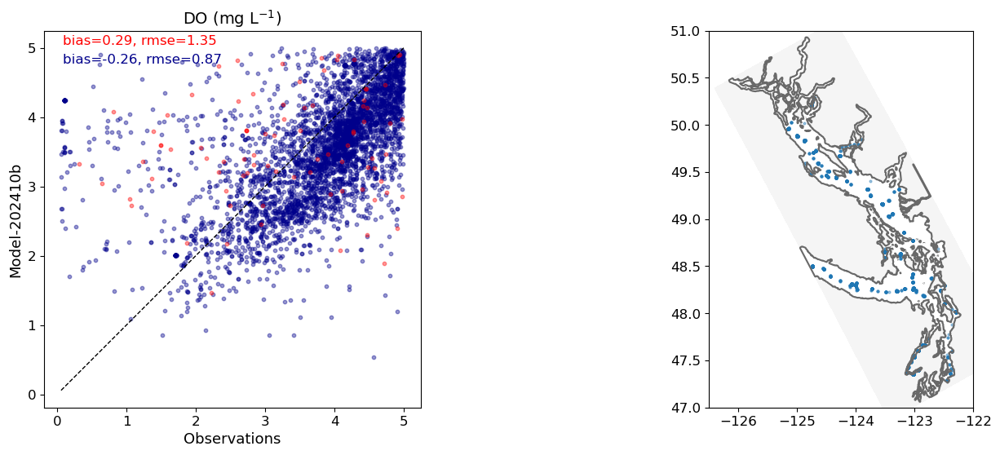

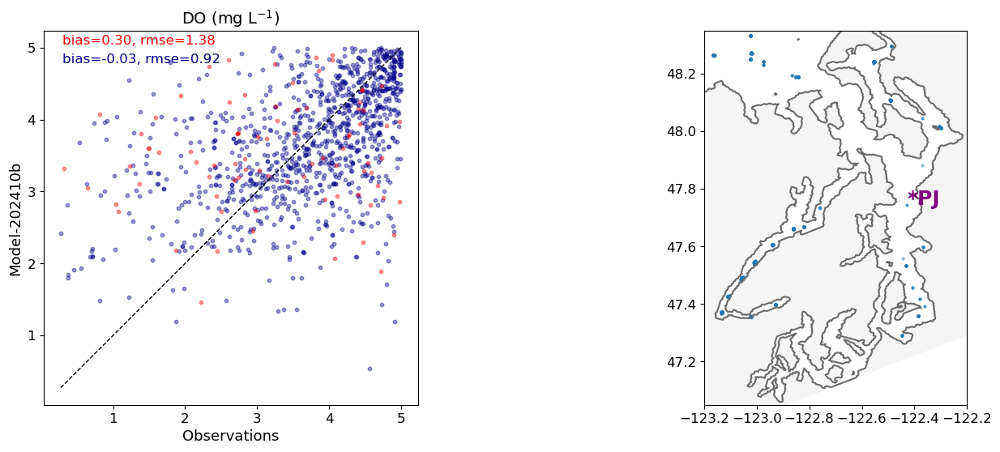

In [ ]:
def plot_comparison_with_map_hypoxic(data, tag, mesh, domain="entire"):

    if domain == "puget":
        lonlim, latlim = [-123.2, -122.2], [47.05, 48.35]
        rectangle = None
        PJ = True
    else:
        lonlim, latlim = [-126.5, -122], [47, 51]
        rectangle = None
        PJ = None

    fig = plt.figure(figsize=(18, 6))
    gs = gridspec.GridSpec(1, 2, width_ratios=[3, 1], wspace=0.15)

    ax_panel = fig.add_subplot(gs[0, 0])
    ax_map   = fig.add_subplot(gs[0, 1])

    # -------------------------------
    # DO processing
    # -------------------------------
    d = subset_domain(data.copy(), domain)

    # mmol/m3 → mg/L
    conv = 0.0319988
    d["Oxygen_Dissolved"] *= conv
    d["mod_dissolved_oxygen"] *= conv

    # DO range filter
    d = d[
        (d["Oxygen_Dissolved"] >= 0) & (d["Oxygen_Dissolved"] <= 5) &
        (d["mod_dissolved_oxygen"] >= 0) & (d["mod_dissolved_oxygen"] <= 5)
    ]

    # -------------------------------
    # Scatter panel
    # -------------------------------
    plot_panel(
    ax_panel,
    d,
    "Oxygen_Dissolved",
    "mod_dissolved_oxygen",
    "DO (mg L$^{-1}$)",
    "Observations",
    f"Model-{tag}",
    )

    domain_map(
        ax_map,
        d,
        mesh,
        lonlim=lonlim,
        latlim=latlim,
        rectangle=rectangle,
        PJ=PJ,
        title="DO Observation Locations (0–7.5 mg/L)",
    )

    plt.show()
mesh = xr.open_dataset("/ocean/atall/MOAD/grid/mesh_mask202108.nc")

plot_comparison_with_map_hypoxic(
    all_410,
    tag="202410b",
    mesh=mesh,
    domain="entire",
)

plot_comparison_with_map_hypoxic(
    all_410,
    tag="202410b",
    mesh=mesh,
    domain="puget",
)


### Ecology from Dakota-Tall VS from Dakota-Parker

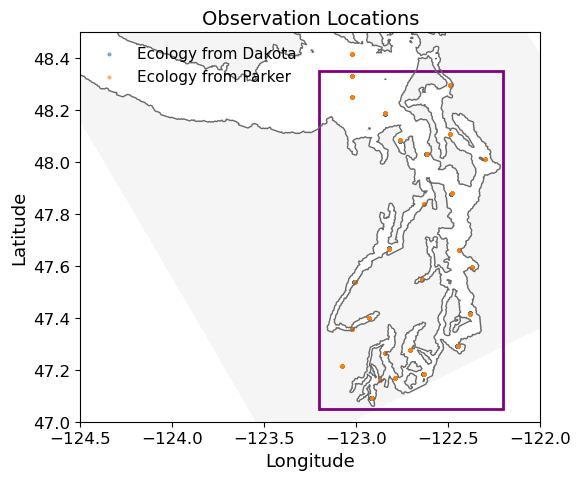

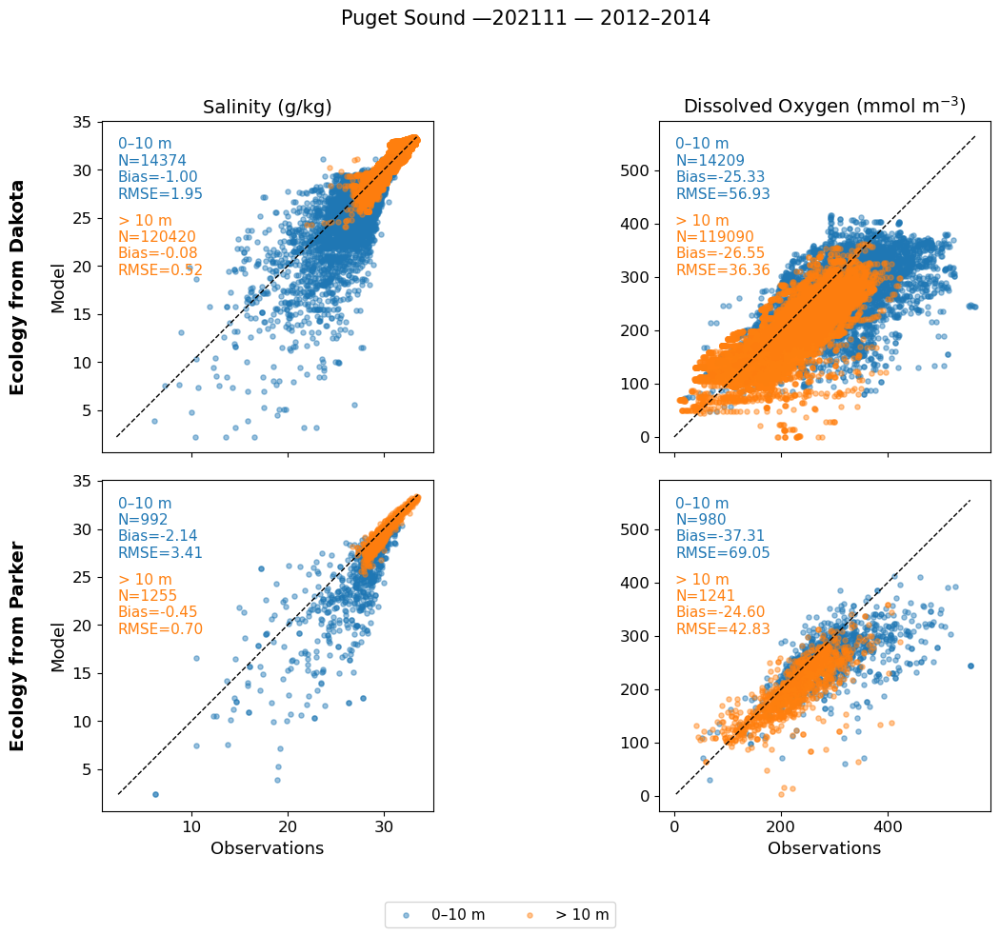

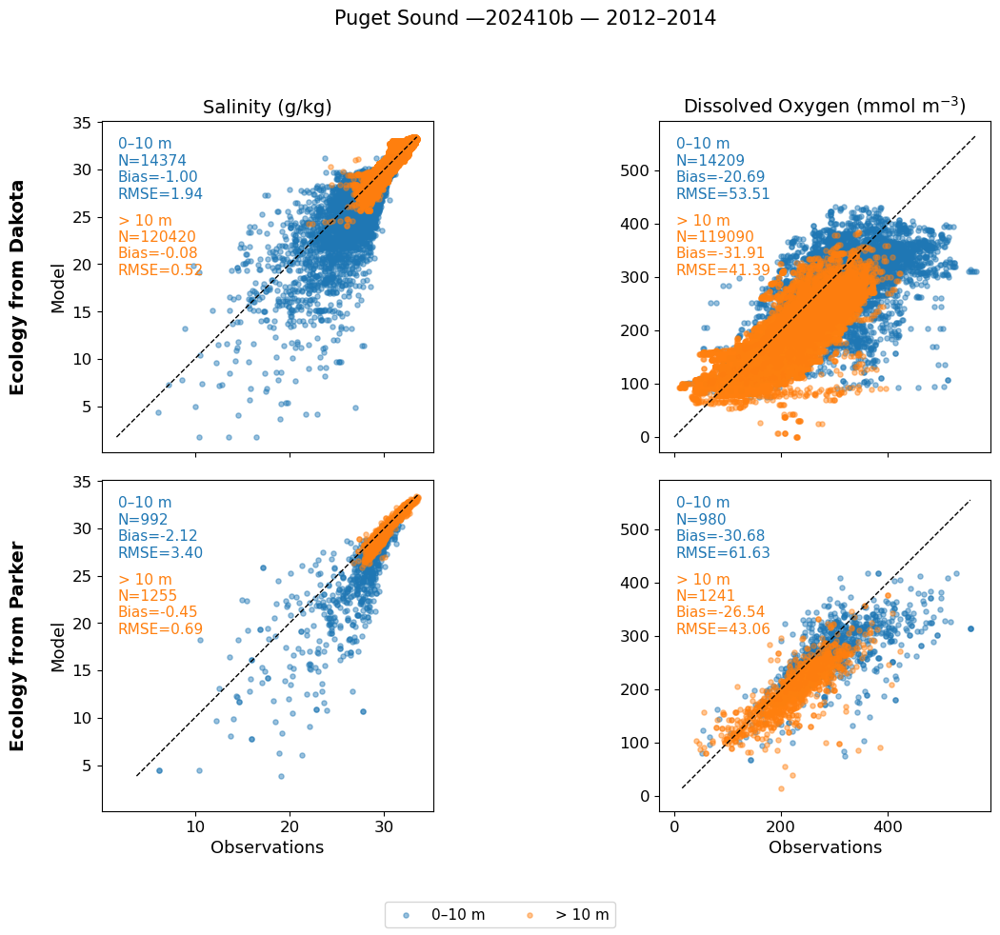

In [ ]:
plt.rcParams.update({
    "font.size": 13,
    "axes.titlesize": 14,
    "axes.labelsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
    "legend.fontsize": 11,
    "figure.titlesize": 15,
})
mesh = xr.open_dataset("/ocean/atall/MOAD/grid/mesh_mask202108.nc")
mbathy = mesh.mbathy
long = mesh.nav_lon
latg = mesh.nav_lat

def plot_observation_map(
    long, latg, mbathy,
    ctd202111, eco202111
):

    fig, ax = plt.subplots(figsize=(6, 5))

    ax.contourf(
        long, latg, mbathy[0, :, :],
        levels=[-0.01, 0.01],
        colors="whitesmoke",
    )

    ax.contour(
        long, latg, mbathy[0, :, :],
        levels=[-0.01, 0.01],
        colors="dimgray",
        linewidths=1,
    )

    ax.scatter(ctd202111["Lon"], ctd202111["Lat"], s=4, alpha=0.5, label="Ecology from Dakota")
    ax.scatter(eco202111["lon"], eco202111["lat"], s=4, alpha=0.5, label="Ecology from Parker")
    
    rect = mpatches.Rectangle(
        (lonPS1, latPS1),
        lonPS2 - lonPS1,
        latPS2 - latPS1,
        fill=False,
        edgecolor="purple",
        linewidth=2,
    )
    ax.add_patch(rect)

    ax.set_xlim([-124.5, -122.0])
    ax.set_ylim([47.0, 48.5])
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

    ax.legend(frameon=False)
    ax.set_title("Observation Locations")

    plt.tight_layout()
    plt.show()

# Puget Sound bounds
lonPS1, lonPS2, latPS1, latPS2 = -123.2, -122.2, 47.05, 48.35


# Loaders
def load_ctd_series(base_path, model_tag, years):
    dfs = []
    for y in years:
        f = f"{base_path}/ObsModel_{model_tag}_ctd_from_UW_{y}0101_{y}1231.csv"
        if Path(f).exists():
            dfs.append(pd.read_csv(f))
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

def load_ecology_parker(base_path, model_tag, years):
    dfs = []
    for y in years:
        f = f"{base_path}/ObsModel_{model_tag}_eco_from_parker_{y}0101_{y}1231.csv"
        if Path(f).exists():
            dfs.append(pd.read_csv(f))
    return pd.concat(dfs, ignore_index=True) if dfs else pd.DataFrame()

# Depth bins
def depth_bins(df, source):
    if source == "Ecology from Dakota":   # Z positive
        return {
            "0–10 m": df[(df["Z"] >= 0) & (df["Z"] <= 10)],
            "> 10 m": df[df["Z"] > 10],
        }
    else:                   # Ecology, Z negative
        return {
            "0–10 m": df[(df["Z"] >= 0) & (df["Z"] <= 10)],
            "> 10 m": df[df["Z"] > 10],
        }

# Main functions
def plot_split_rows(ctd_df, eco_df, model_label, year_range):

    fig, axes = plt.subplots(2, 2, figsize=(13, 10), sharex="col", sharey="col")

    depth_colors = {"0–10 m": "tab:blue", "> 10 m": "tab:orange"}

    datasets = [
        ("Ecology from Dakota", ctd_df, 0),
        ("Ecology from Parker", eco_df, 1),
    ]

    variables = [
        ("Salinity", "mod_vosaline",
         "Observations", "Model"),
        ("Oxygen_Dissolved", "mod_dissolved_oxygen",
         "Observations", "Model")
    ]

    for source, df0, row in datasets:

        if df0.empty:
            continue

        d = df0.copy()
        d["dtUTC"] = pd.to_datetime(d["dtUTC"])

        # Spatial filter
        d = d[
            (d["Lon"] >= lonPS1) & (d["Lon"] <= lonPS2) &
            (d["Lat"] >= latPS1) & (d["Lat"] <= latPS2)
        ]

        bins = depth_bins(d, source)

        for col, (var, mod_var, xlabel, ylabel) in enumerate(variables):

            ax = axes[row, col]
            dvar = d.dropna(subset=[var, mod_var, "Z"])

            y_text = 0.95

            for depth_label, df in bins.items():
                df = df.dropna(subset=[var, mod_var])
                if df.empty:
                    continue

                ax.scatter(
                    df[var],
                    df[mod_var],
                    s=14,
                    alpha=0.45,
                    color=depth_colors[depth_label],
                    label=depth_label if row == 0 else None,
                )

                diff = df[mod_var] - df[var]
                bias = diff.mean()
                rmse = np.sqrt((diff**2).mean())
                npts = len(df)

                ax.text(
                    0.05,
                    y_text,
                    f"{depth_label}\nN={npts}\nBias={bias:.2f}\nRMSE={rmse:.2f}",
                    transform=ax.transAxes,
                    color=depth_colors[depth_label],
                    fontsize=11,
                    ha="left",
                    va="top",
                )
                y_text -= 0.23

            if not dvar.empty:
                lims = [
                    min(dvar[var].min(), dvar[mod_var].min()),
                    max(dvar[var].max(), dvar[mod_var].max()),
                ]
                ax.plot(lims, lims, "k--", lw=1)
                ax.set_aspect("equal")

            if row == 1:
                ax.set_xlabel(xlabel)
            if col == 0:
                ax.set_ylabel(ylabel)

            if row == 0:
                ax.set_title("Salinity (g/kg)" if col == 0 else "Dissolved Oxygen (mmol m$^{-3}$)")

        axes[row, 0].annotate(
            source,
            xy=(-0.25, 0.5),
            xycoords="axes fraction",
            rotation=90,
            ha="center",
            va="center",
            fontsize=14,
            fontweight="bold",
        )

    handles, labels = axes[0, 0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower center", ncol=2)

    fig.suptitle(
        f"Puget Sound —"
        f"{model_label} — {year_range}",
        y=0.97
    )

    fig.tight_layout(rect=[0, 0.06, 1, 0.94])
    plt.show()


# Load data
base_202111 = "/ocean/atall/MOAD/ObsModel/202111"
base_202410 = "/ocean/atall/MOAD/ObsModel/202410"
base_202410daily = "/ocean/atall/MOAD/ObsModel/202410bdaily"

ctd202111 = load_ctd_series(base_202111, "202111", range(2012, 2015))
eco202111 = load_ecology_parker(base_202111, "202111", range(2012, 2015))

ctd202410 = load_ctd_series(base_202410, "202410", range(2012, 2015))
eco202410 = load_ecology_parker(base_202410daily, "202410b", range(2012, 2015))

# Plot
plot_observation_map(
    long, latg, mbathy,
    pd.read_pickle('/ocean/atall/MOAD/Obs/PugetSound/ecology_fromDakota_UW/fixedTall/ctd_2018.p'),
    pd.read_pickle('/ocean/atall/MOAD/Obs/PugetSound/pmcready/ecology_nc/2018.p')
)
plot_split_rows(ctd202111, eco202111, "202111", "2012–2014")
plot_split_rows(ctd202410, eco202410, "202410b", "2012–2014")
